# MBTI Project

By The Introverts 

#  For saving time, find and run step1,2,3 before modeling:

In [35]:
reset -fs

In [1]:
from nltk.stem.porter import *
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk import word_tokenize
from sklearn.feature_extraction import stop_words
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from wordcloud import WordCloud
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string 
import re
from collections import Counter
from sklearn.preprocessing import MinMaxScaler
import numpy as np
plt.style.use('fivethirtyeight')

# Step3

## Base Model: MultinomialNB & Logistic Regression

In [2]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, f1_score
from sklearn.model_selection import StratifiedKFold, StratifiedShuffleSplit
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
import time
import warnings
warnings.filterwarnings('ignore')
from random import choice
import lightgbm as lgb
import gc
from xgboost.sklearn import XGBClassifier

In [3]:
mbti_tfidf = pd.read_csv("data/mbti_tfidf.csv")
mbti_ct = pd.read_csv("data/mbti_ct.csv")

In [99]:
mbti_ct.head()

,type,posts,EorI,NorS,TorF,JorP,ability,able,absolute,absolutely,...,year ago,year old,yep,yes yes,yesterday,young,younger,youtube,yup,zone
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
1,ENTP,'I'm finding the lack of me in these posts ver...,1,0,1,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,INTP,'Good one _____ https://www.youtube.com/wat...,0,0,1,1,2,1,0,2,...,0,1,0,0,0,0,0,0,1,0
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",0,0,1,0,0,2,1,0,...,0,0,0,0,0,0,0,0,0,0
4,ENTJ,'You're fired.|||That's another silly misconce...,1,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [4]:
# initialize
MNB = MultinomialNB()
LR = LogisticRegression(random_state=0, max_iter=10)
target = mbti_tfidf.iloc[:,2:6]
# X_tf = np.column_stack((mbti.iloc[:,6:].drop('Sentiment',axis=1),word_tfidf_df))
# X_ct = np.column_stack((mbti.iloc[:,6:].drop('Sentiment',axis=1),word_ct_df))

X_tfidf = mbti_tfidf.iloc[:,6:]
X_ct = mbti_ct.iloc[:,6:]

In [5]:
# PCA or NMF 

from sklearn.decomposition import NMF  # MNB only takes non-negative matrices

nmf_tfidf = NMF(n_components=20, random_state=420)
nmf_ct = NMF(n_components=20, random_state=420)

pca_tfidf = PCA(n_components=20, random_state=420)
pca_ct = PCA(n_components=20, random_state=420)

X_tfidf_nmf_50 = pd.DataFrame(nmf_tfidf.fit_transform(X_tfidf))
X_ct_nmf_50 = pd.DataFrame(nmf_ct.fit_transform(X_tfidf))

X_tfidf_pca_50 = pd.DataFrame(pca_tfidf.fit_transform(X_tfidf))
X_ct_pca_50 = pd.DataFrame(pca_ct.fit_transform(X_ct))


KeyboardInterrupt: 

In [6]:
# LSA
from sklearn.decomposition import TruncatedSVD  # aka LSA
lsa_tfidf = TruncatedSVD(n_components=50, random_state=420)
lsa_ct = TruncatedSVD(n_components=50, random_state=420)

X_tfidf_lsa_50 = pd.DataFrame(lsa_tfidf.fit_transform(X_tfidf))
X_ct_lsa_50 = pd.DataFrame(lsa_ct.fit_transform(X_ct))

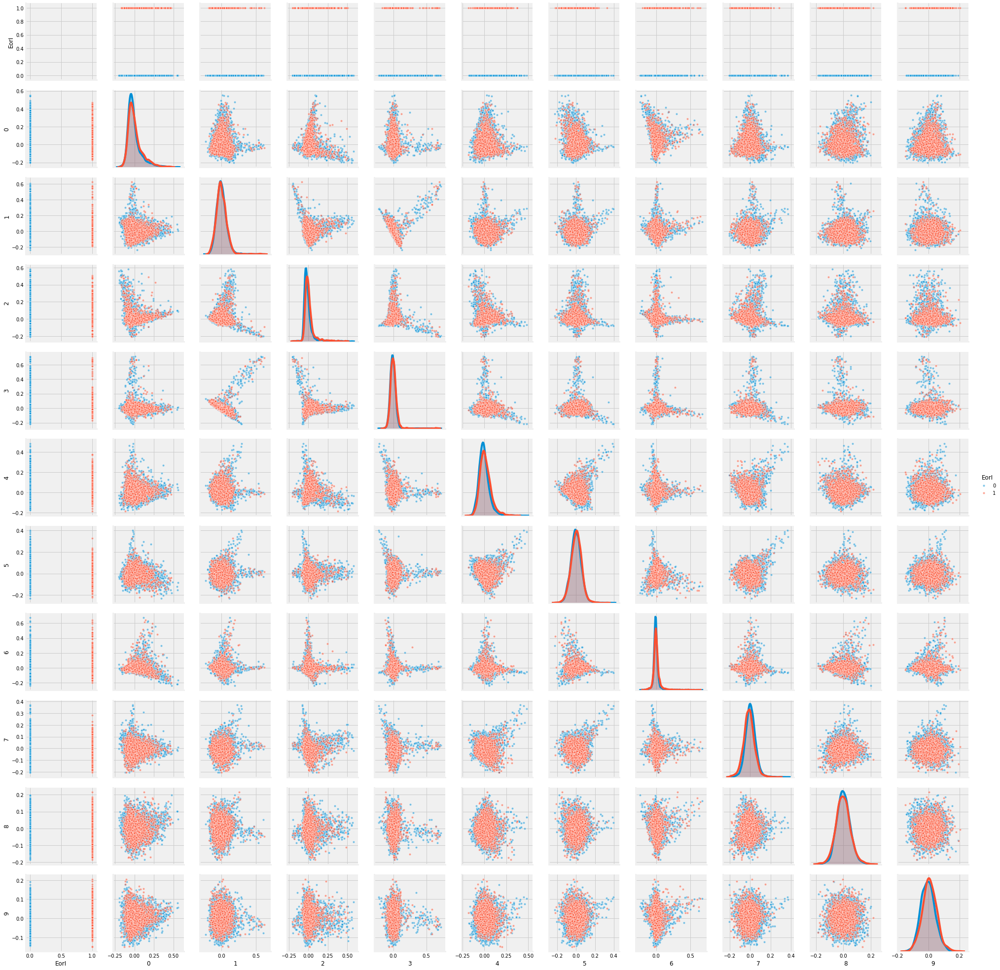

In [11]:
sns.pairplot(pd.concat([target['EorI'], X_tfidf_pca_50.iloc[:,:10]], axis=1), hue='EorI', plot_kws={"s": 20, "alpha": 0.5})

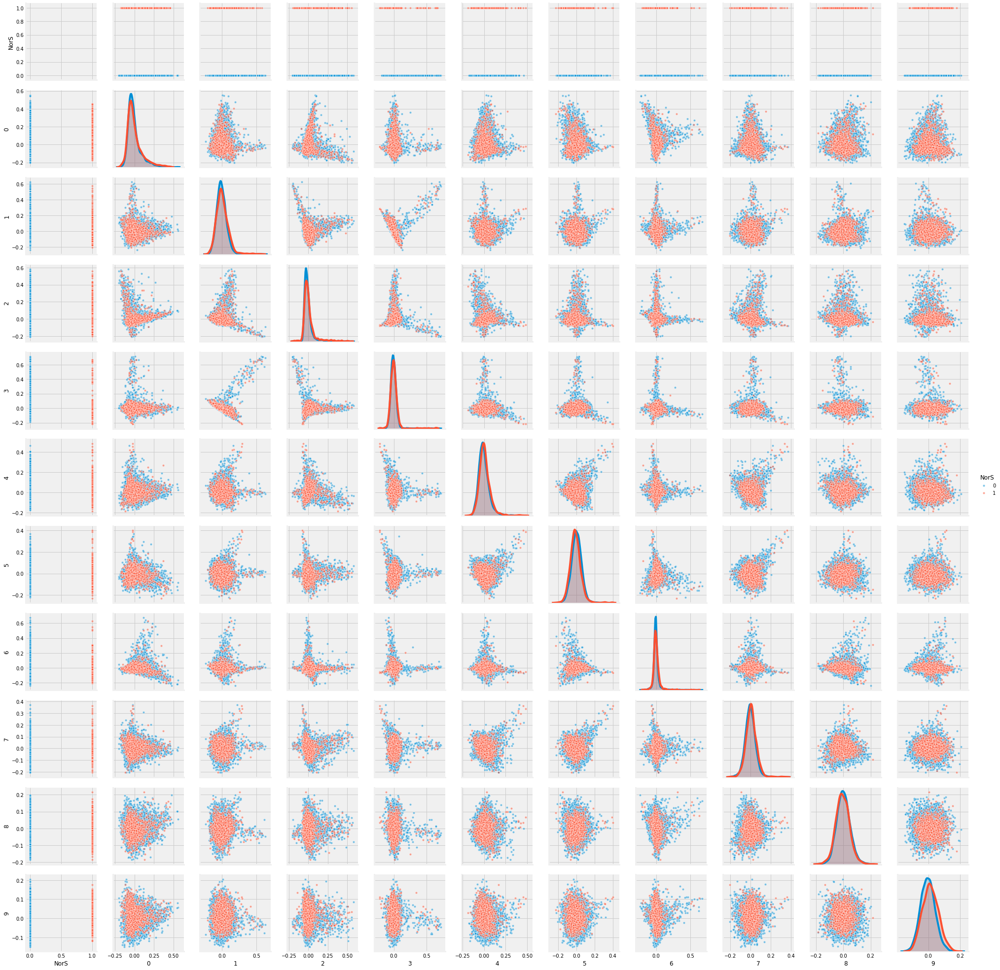

In [15]:
sns.pairplot(pd.concat([target['NorS'], X_tfidf_pca_50.iloc[:,:10]], axis=1), hue='NorS', plot_kws={"s": 20, "alpha": 0.5})

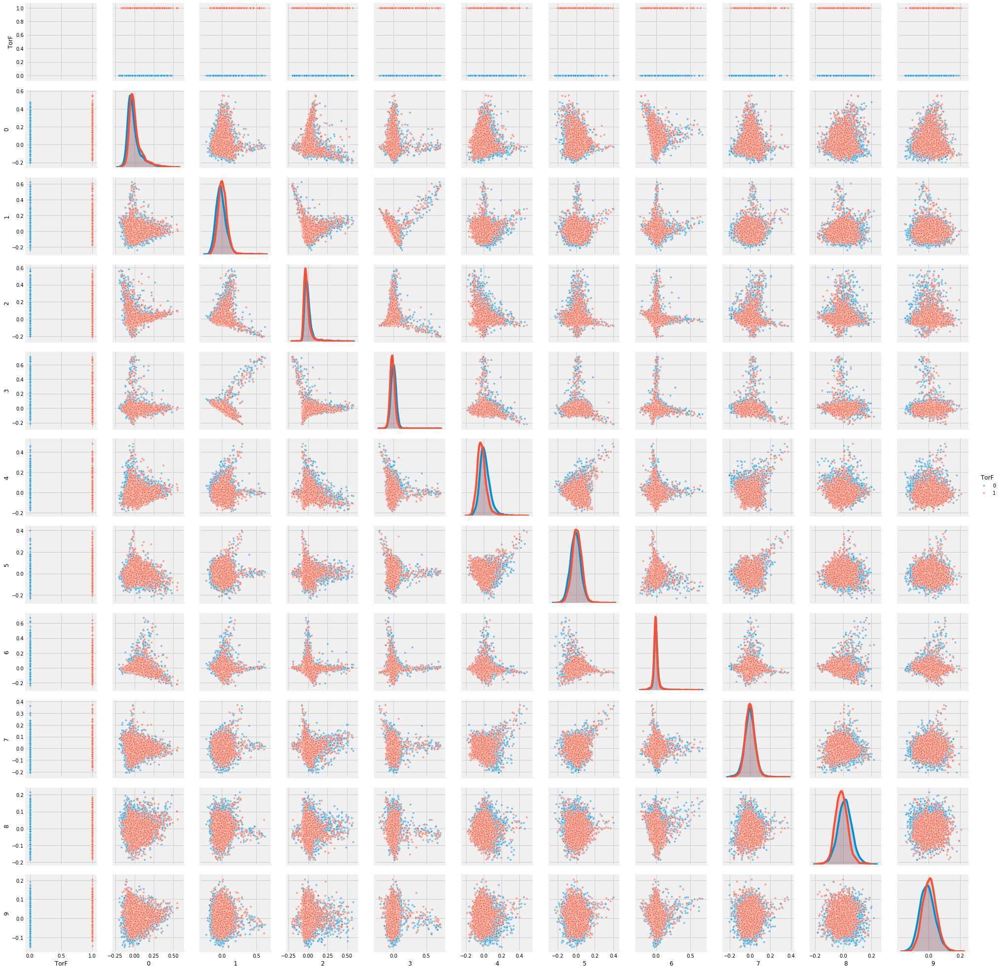

In [13]:
sns.pairplot(pd.concat([target['TorF'], X_tfidf_pca_50.iloc[:,:10]], axis=1), hue='TorF', plot_kws={"s": 20, "alpha": 0.5})

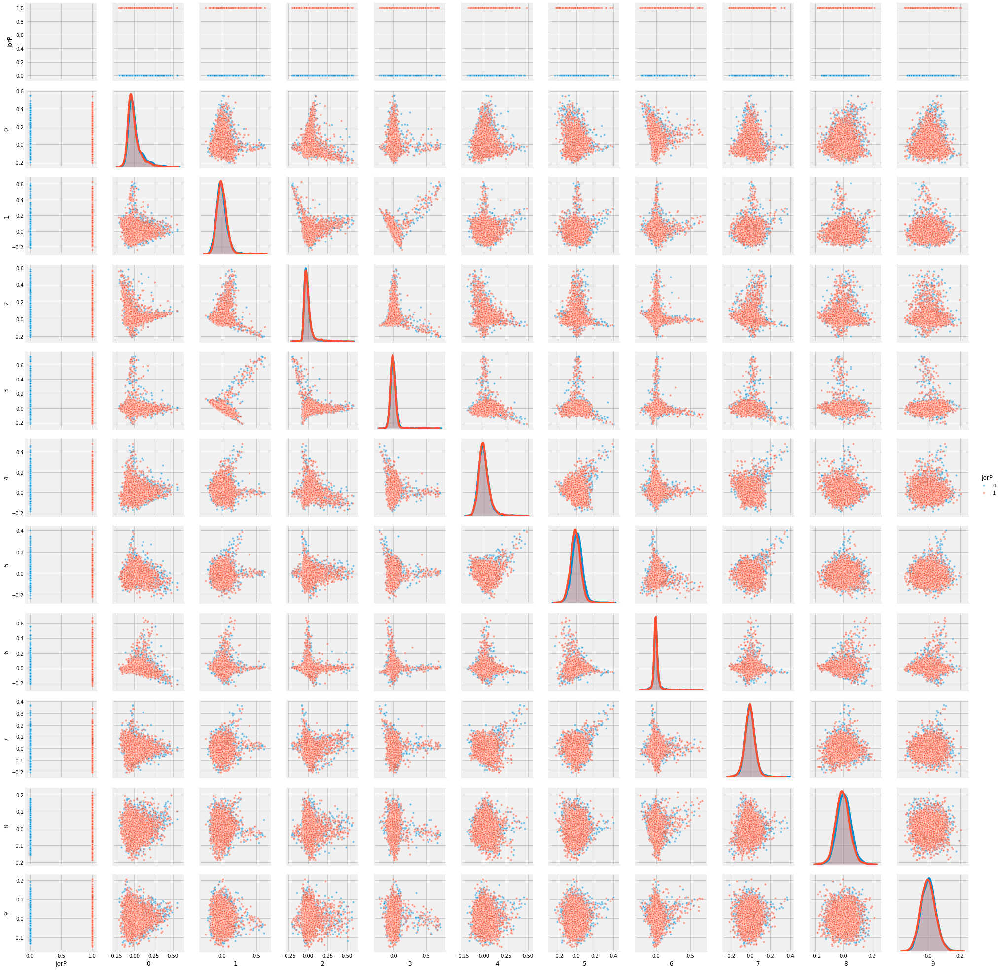

In [14]:
sns.pairplot(pd.concat([target['JorP'], X_tfidf_pca_50.iloc[:,:10]], axis=1), hue='JorP', plot_kws={"s": 20, "alpha": 0.5})

In [7]:
from sklearn.manifold import TSNE

tsne = TSNE(perplexity = 150)
#X_tsne = tsne.fit_transform(X_tfidf_pca_50)
X_tsne = tsne.fit_transform(X_tfidf_lsa_50)

Text(0.5, 1.0, 'TSNE plot EorI')

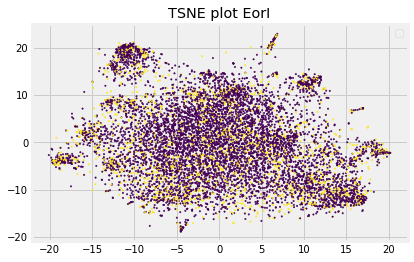

In [51]:
#targets_X_tsne = pd.concat([target, X_tsne], axis=1)
plt.scatter(X_tsne[:,0], X_tsne[:,1], s=2, c=target['EorI'], alpha=1, )
plt.legend(('e', 'i')
plt.title("TSNE plot EorI")

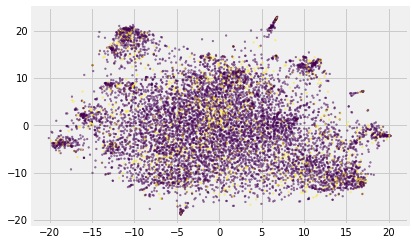

In [39]:
plt.scatter(X_tsne[:,0], X_tsne[:,1], s=3, c=target['NorS'], alpha=0.5)

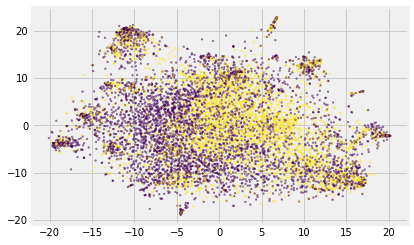

In [38]:
plt.scatter(X_tsne[:,0], X_tsne[:,1], s=3, c=target['TorF'], alpha=0.5)

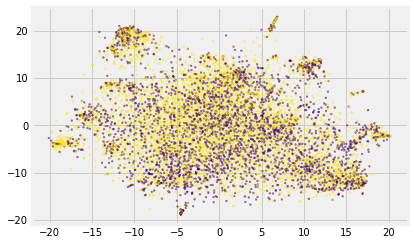

In [37]:
plt.scatter(X_tsne[:,0], X_tsne[:,1], s=3, c=target['JorP'], alpha=0.5)

In [12]:
def model(model, X, target, nsplits=4):
    kf = StratifiedShuffleSplit(n_splits=nsplits, random_state=420)
    
    types = {'EorI':'Extroversion vs. Introversion', 'NorS': 'Intuition vs. Sensing',
                 'TorF': 'Thinking vs. Feeling','JorP': 'Judging vs. Perceiving'}
    t = time.time()
    for col in target.columns:
        print(f"{types[col]}:")
        y = target[col]
        all_auc = []
        all_accuracies = []
        for train, test in kf.split(X,y):
            X_train, X_test, y_train, y_test = X.loc[train], X.loc[test], y[train], y[test]
            model.fit(X_train, y_train)
            preds = model.predict(X_test)
            auc = roc_auc_score(y_test, preds)
            all_auc.append(auc)
            accuracy = accuracy_score(preds, y_test)
            all_accuracies.append(accuracy)
            model_name = str(model).split('(')[0]
        print(f'Average AUC: {np.mean(all_auc):.3f}; Average Accuracy: {np.mean(all_accuracies):.3f}')
    print(f"Time use:{time.time()-t:.3f}s")
    

### NMF

In [85]:
model(MNB, X_tfidf_nmf_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.500; Average Accuracy: 0.770
Intuition vs. Sensing:
Average AUC: 0.500; Average Accuracy: 0.862
Thinking vs. Feeling:
Average AUC: 0.500; Average Accuracy: 0.541
Judging vs. Perceiving:
Average AUC: 0.500; Average Accuracy: 0.604
Time use:0.201s


In [86]:
model(LR, X_tfidf_nmf_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.500; Average Accuracy: 0.770
Intuition vs. Sensing:
Average AUC: 0.500; Average Accuracy: 0.862
Thinking vs. Feeling:
Average AUC: 0.706; Average Accuracy: 0.717
Judging vs. Perceiving:
Average AUC: 0.502; Average Accuracy: 0.604
Time use:0.823s


In [87]:
model(MNB, X_ct_nmf_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.500; Average Accuracy: 0.770
Intuition vs. Sensing:
Average AUC: 0.500; Average Accuracy: 0.862
Thinking vs. Feeling:
Average AUC: 0.500; Average Accuracy: 0.541
Judging vs. Perceiving:
Average AUC: 0.500; Average Accuracy: 0.604
Time use:0.194s


In [88]:
model(LR, X_ct_nmf_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.500; Average Accuracy: 0.770
Intuition vs. Sensing:
Average AUC: 0.500; Average Accuracy: 0.862
Thinking vs. Feeling:
Average AUC: 0.706; Average Accuracy: 0.717
Judging vs. Perceiving:
Average AUC: 0.502; Average Accuracy: 0.604
Time use:0.800s


### PCA

In [89]:
model(LR, X_tfidf_pca_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.526; Average Accuracy: 0.774
Intuition vs. Sensing:
Average AUC: 0.500; Average Accuracy: 0.862
Thinking vs. Feeling:
Average AUC: 0.777; Average Accuracy: 0.779
Judging vs. Perceiving:
Average AUC: 0.589; Average Accuracy: 0.650
Time use:1.170s


In [90]:
model(LR, X_ct_pca_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.539; Average Accuracy: 0.769
Intuition vs. Sensing:
Average AUC: 0.501; Average Accuracy: 0.859
Thinking vs. Feeling:
Average AUC: 0.742; Average Accuracy: 0.745
Judging vs. Perceiving:
Average AUC: 0.599; Average Accuracy: 0.658
Time use:1.472s


### LSA

In [13]:
model(LR, X_tfidf_lsa_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.523; Average Accuracy: 0.772
Intuition vs. Sensing:
Average AUC: 0.500; Average Accuracy: 0.862
Thinking vs. Feeling:
Average AUC: 0.776; Average Accuracy: 0.779
Judging vs. Perceiving:
Average AUC: 0.586; Average Accuracy: 0.648
Time use:1.109s


In [19]:
model(LR, X_ct_lsa_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.536; Average Accuracy: 0.768
Intuition vs. Sensing:
Average AUC: 0.500; Average Accuracy: 0.859
Thinking vs. Feeling:
Average AUC: 0.742; Average Accuracy: 0.744
Judging vs. Perceiving:
Average AUC: 0.595; Average Accuracy: 0.653
Time use:1.616s


## Advanced Model: Xgboost & Lightgbm

### Xgboost

In [17]:
XGB = XGBClassifier()

### PCA

In [76]:
model(XGB, X_tfidf_pca_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.529; Average Accuracy: 0.774
Intuition vs. Sensing:
Average AUC: 0.508; Average Accuracy: 0.862
Thinking vs. Feeling:
Average AUC: 0.747; Average Accuracy: 0.752
Judging vs. Perceiving:
Average AUC: 0.595; Average Accuracy: 0.652
Time use:37.618s


In [77]:
model(XGB, X_ct_pca_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.518; Average Accuracy: 0.768
Intuition vs. Sensing:
Average AUC: 0.499; Average Accuracy: 0.860
Thinking vs. Feeling:
Average AUC: 0.718; Average Accuracy: 0.722
Judging vs. Perceiving:
Average AUC: 0.577; Average Accuracy: 0.640
Time use:35.546s


### NMF

In [82]:
model(XGB, X_tfidf_nmf_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.526; Average Accuracy: 0.768
Intuition vs. Sensing:
Average AUC: 0.500; Average Accuracy: 0.859
Thinking vs. Feeling:
Average AUC: 0.748; Average Accuracy: 0.750
Judging vs. Perceiving:
Average AUC: 0.566; Average Accuracy: 0.628
Time use:27.220s


In [83]:
model(XGB, X_ct_nmf_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.526; Average Accuracy: 0.768
Intuition vs. Sensing:
Average AUC: 0.500; Average Accuracy: 0.859
Thinking vs. Feeling:
Average AUC: 0.748; Average Accuracy: 0.750
Judging vs. Perceiving:
Average AUC: 0.566; Average Accuracy: 0.628
Time use:25.030s


### LSA

In [18]:
model(XGB, X_tfidf_lsa_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.524; Average Accuracy: 0.770
Intuition vs. Sensing:
Average AUC: 0.513; Average Accuracy: 0.864
Thinking vs. Feeling:
Average AUC: 0.757; Average Accuracy: 0.761
Judging vs. Perceiving:
Average AUC: 0.591; Average Accuracy: 0.646
Time use:39.372s


In [20]:
model(XGB, X_ct_lsa_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.519; Average Accuracy: 0.768
Intuition vs. Sensing:
Average AUC: 0.499; Average Accuracy: 0.860
Thinking vs. Feeling:
Average AUC: 0.721; Average Accuracy: 0.724
Judging vs. Perceiving:
Average AUC: 0.582; Average Accuracy: 0.642
Time use:38.500s


### LightGBM

In [22]:
LGB = lgb.LGBMClassifier()

### PCA

In [79]:
model(LGB, X_tfidf_pca_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.552; Average Accuracy: 0.772
Intuition vs. Sensing:
Average AUC: 0.518; Average Accuracy: 0.861
Thinking vs. Feeling:
Average AUC: 0.757; Average Accuracy: 0.761
Judging vs. Perceiving:
Average AUC: 0.602; Average Accuracy: 0.647
Time use:20.694s


In [81]:
model(LGB, X_ct_pca_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.535; Average Accuracy: 0.763
Intuition vs. Sensing:
Average AUC: 0.505; Average Accuracy: 0.860
Thinking vs. Feeling:
Average AUC: 0.717; Average Accuracy: 0.722
Judging vs. Perceiving:
Average AUC: 0.581; Average Accuracy: 0.632
Time use:20.662s


### LSA

In [23]:
model(LGB, X_tfidf_lsa_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.541; Average Accuracy: 0.763
Intuition vs. Sensing:
Average AUC: 0.526; Average Accuracy: 0.865
Thinking vs. Feeling:
Average AUC: 0.762; Average Accuracy: 0.766
Judging vs. Perceiving:
Average AUC: 0.597; Average Accuracy: 0.641
Time use:22.502s


In [24]:
model(LGB, X_ct_lsa_50, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.525; Average Accuracy: 0.758
Intuition vs. Sensing:
Average AUC: 0.505; Average Accuracy: 0.861
Thinking vs. Feeling:
Average AUC: 0.720; Average Accuracy: 0.724
Judging vs. Perceiving:
Average AUC: 0.582; Average Accuracy: 0.635
Time use:23.256s


Lightgbm performs a bit better than xgboost in terms of AUC and Accuracy and saves much more time. Besides, Lightgbm running on tfidf vectors outperforms a little bit. I decide to go further on lightgbm and dataset containing tfidf vectors(X_tf).

### Random Search
- iteration=20 takes nearly 25mins to run

In [93]:
kf = StratifiedShuffleSplit(n_splits=5, random_state=420)

types = {'EorI':'Extroversion vs. Introversion', 'NorS': 'Intuition vs. Sensing',
                 'TorF': 'Thinking vs. Feeling','JorP': 'Judging vs. Perceiving'}
# loop for random search
n_iterations=20

print ("Random search start...")
for col in target.columns:
    print(f"* {types[col]} ")
    y = target[col]
    roc_auc_mean = []
    dict_list = []
    for i in range(0, n_iterations):

        param_dist = {'n_estimators' : choice([250,300,350,400,450]),
                  'bagging_fraction': choice([0.5, 0.7, 0.8, 0.9]),
                  'learning_rate': choice([0.01, 0.05, 0.1, 0.3, 0.5]),
                  'is_unbalance': True,
                  'max_bin': choice([3, 5, 10, 15, 18, 20, 25]),
                  'boosting_type' : choice(['gbdt', 'dart']),
                  'max_depth': choice([2,3,4,5]),      
                  'feature_fraction': choice([0.7, 0.8, 0.9]),
                  'lambda_l1': choice([0, 10, 20, 30, 40]),
                  'objective': 'binary', 
                  'metric': 'auc'} 

        roc_l = []

        for train, test in kf.split(X_ct_pca_50,y):

            X_train, X_test, y_train, y_test = X_ct_pca_50.loc[train], X_tfidf_pca_50.loc[test], y[train], y[test]

            # training
            gbm = lgb.LGBMClassifier(**param_dist)
            gbm.fit(X_train,y_train)
            # predicting
            y_pred = gbm.predict(X_test)
            roc = roc_auc_score(y_test, y_pred)
            roc_l.append(roc)

        roc_array = np.asarray(roc_l)

        roc_auc_mean.append(roc_array.mean())
        dict_list.append(param_dist)
        gc.collect()

    results_pd = pd.DataFrame({"roc_auc_mean": roc_auc_mean,"parameters": dict_list})    

    results_pd.sort_values("roc_auc_mean", ascending = False, axis = 0, inplace = True)
    top_pd = results_pd.head(1)
    print(f"--> Best AUC:{top_pd.iloc[0,0]} using {top_pd.iloc[0,1]}")

Random search start...
* Extroversion vs. Introversion 
--> Best AUC:0.5386287425149701 using {'n_estimators': 400, 'bagging_fraction': 0.7, 'learning_rate': 0.01, 'is_unbalance': True, 'max_bin': 3, 'boosting_type': 'dart', 'max_depth': 5, 'feature_fraction': 0.9, 'lambda_l1': 20, 'objective': 'binary', 'metric': 'auc'}
* Intuition vs. Sensing 
--> Best AUC:0.5062789661319073 using {'n_estimators': 300, 'bagging_fraction': 0.7, 'learning_rate': 0.1, 'is_unbalance': True, 'max_bin': 15, 'boosting_type': 'gbdt', 'max_depth': 3, 'feature_fraction': 0.7, 'lambda_l1': 10, 'objective': 'binary', 'metric': 'auc'}
* Thinking vs. Feeling 
--> Best AUC:0.6116967817812466 using {'n_estimators': 400, 'bagging_fraction': 0.9, 'learning_rate': 0.5, 'is_unbalance': True, 'max_bin': 3, 'boosting_type': 'dart', 'max_depth': 4, 'feature_fraction': 0.8, 'lambda_l1': 30, 'objective': 'binary', 'metric': 'auc'}
* Judging vs. Perceiving 
--> Best AUC:0.5284750576957217 using {'n_estimators': 350, 'bagging_

In [40]:
def lgbmodel(X, target, nsplits=5):
    kf = StratifiedShuffleSplit(n_splits=nsplits, random_state=420)
    
    types = {'EorI':'Extroversion vs. Introversion', 'NorS': 'Intuition vs. Sensing',
                 'TorF': 'Thinking vs. Feeling','JorP': 'Judging vs. Perceiving'}
    # choose the random search result
    para_list = [{'n_estimators': 450, 'bagging_fraction': 0.8, 'learning_rate': 0.5, 'is_unbalance': True, 'max_bin': 15, 'boosting_type': 'dart', 'max_depth': 3, 'feature_fraction': 0.7, 'lambda_l1': 40, 'objective': 'binary', 'metric': 'auc'},
              {'n_estimators': 450, 'bagging_fraction': 0.5, 'learning_rate': 0.3, 'is_unbalance': True, 'max_bin': 25, 'boosting_type': 'gbdt', 'max_depth': 2, 'feature_fraction': 0.7, 'lambda_l1': 40, 'objective': 'binary', 'metric': 'auc'},
              {'n_estimators': 250, 'bagging_fraction': 0.8, 'learning_rate': 0.3, 'is_unbalance': True, 'max_bin': 5, 'boosting_type': 'dart', 'max_depth': 5, 'feature_fraction': 0.8, 'lambda_l1': 40, 'objective': 'binary', 'metric': 'auc'},
              {'n_estimators': 450, 'bagging_fraction': 0.8, 'learning_rate': 0.05, 'is_unbalance': True, 'max_bin': 5, 'boosting_type': 'gbdt', 'max_depth': 3, 'feature_fraction': 0.9, 'lambda_l1': 10, 'objective': 'binary', 'metric': 'auc'}]
    
    t = time.time()
    i = 0
    for col in target.columns:
        param = para_list[i]
        i+=1
        print(f"{types[col]}:")
        y = target[col]
        all_auc = []
        all_accuracies = []
        for train, test in kf.split(X,y):
            X_train, X_test, y_train, y_test = X.loc[train], X.loc[test], y[train], y[test]
    
            gbm = lgb.LGBMClassifier(**param)
            gbm.fit(X_train,y_train)
            # predicting
            y_pred = gbm.predict(X_test)
            auc = roc_auc_score(y_test, y_pred)
            all_auc.append(auc)
            accuracy = accuracy_score(y_test, y_pred)
            all_accuracies.append(accuracy)
            model_name = 'LightGBM'
        print(f'Average AUC: {np.mean(all_auc):.3f}; Average Accuracy: {np.mean(all_accuracies):.3f}')
    print(f"Time use:{time.time()-t:.3f}s")

In [41]:
lgbmodel(X_tf, target, nsplits=5)

Extroversion vs. Introversion:
Average AUC: 0.670; Average Accuracy: 0.715
Intuition vs. Sensing:
Average AUC: 0.651; Average Accuracy: 0.756
Thinking vs. Feeling:
Average AUC: 0.774; Average Accuracy: 0.774
Judging vs. Perceiving:
Average AUC: 0.651; Average Accuracy: 0.661
Time use:78.018s


## Feature Importance

In [42]:
para_list = [{'n_estimators': 450, 'bagging_fraction': 0.8, 'learning_rate': 0.5, 'is_unbalance': True, 'max_bin': 15, 'boosting_type': 'dart', 'max_depth': 3, 'feature_fraction': 0.7, 'lambda_l1': 40, 'objective': 'binary', 'metric': 'auc'},
              {'n_estimators': 450, 'bagging_fraction': 0.5, 'learning_rate': 0.3, 'is_unbalance': True, 'max_bin': 25, 'boosting_type': 'gbdt', 'max_depth': 2, 'feature_fraction': 0.7, 'lambda_l1': 40, 'objective': 'binary', 'metric': 'auc'},
              {'n_estimators': 250, 'bagging_fraction': 0.8, 'learning_rate': 0.3, 'is_unbalance': True, 'max_bin': 5, 'boosting_type': 'dart', 'max_depth': 5, 'feature_fraction': 0.8, 'lambda_l1': 40, 'objective': 'binary', 'metric': 'auc'},
              {'n_estimators': 450, 'bagging_fraction': 0.8, 'learning_rate': 0.05, 'is_unbalance': True, 'max_bin': 5, 'boosting_type': 'gbdt', 'max_depth': 3, 'feature_fraction': 0.9, 'lambda_l1': 10, 'objective': 'binary', 'metric': 'auc'}]

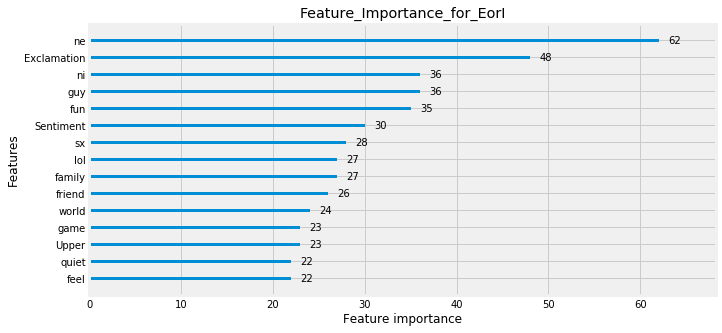

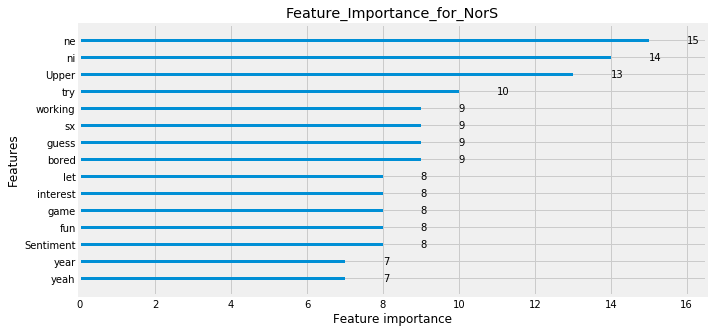

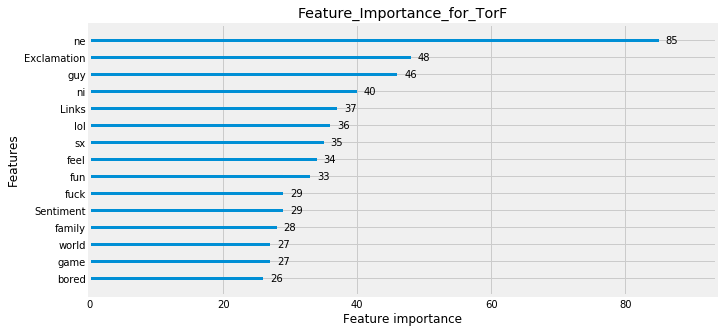

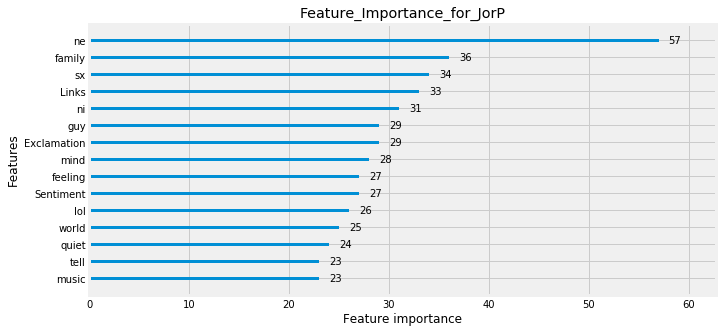

In [43]:
for i in range(4):
    label = target.columns
    y = target.values[:,0]
    # fit model on training data
    LGB = lgb.LGBMClassifier(**para_list[i])
    LGB.fit(X_tf, y)
    # plot feature importance
    ax = lgb.plot_importance(LGB, max_num_features=15)

    fig = ax.figure
    fig.set_size_inches(10, 5)
    plt.title(f"Feature_Importance_for_{label[i]}")
    plt.show()

### Additional things to Consider:

- RF and KNN models
- Visualization to compare the model performances
- How to explain EorI things to the auidence in an easy way
- PCA 
- others....